# Badly predicted proteins

In [1]:
from IPython.utils import io

with io.capture_output() as captured:
    !pip install matplotlib_venn
    !pip install py3Dmol
    !pip install upsetplot

print(captured.stdout if ("Error" in captured.stdout) or ("ERROR" in captured.stdout) else "Installation successful")

Installation successful


In [2]:
import pandas as pd
from typing import Dict, List, Set

In [3]:
chains = pd.read_csv("data/filtered/chains_evaluation_filtered_with_gdt.csv").dropna()
chains

,pdb_id,label,chain_id,AF_average_pLDDT,OF_average_pLDDT,EF_average_pLDDT,AF_TM_score,OF_TM_score,EF_TM_score,AF_RMSD,OF_RMSD,EF_RMSD,AF_GDT_TS,OF_GDT_TS,EF_GDT_TS
0,8P0E,monomer,8P0E:A,93.108947,93.535368,89.263158,0.966687,0.967459,0.982825,1.757680,1.738276,0.703625,96.603261,96.467391,97.826087
1,8PX8,monomer,8PX8:A,95.914087,95.609217,95.147826,0.995011,0.995740,0.989534,0.275844,0.253193,0.706370,100.000000,100.000000,99.318182
2,8B2E,monomer,8B2E:A,97.636503,97.136084,94.762238,0.991946,0.979414,0.990990,0.400699,0.668645,0.425292,99.822695,97.517730,99.468085
3,8HOE,monomer,8HOE:A,93.577196,79.554392,89.613757,0.988360,0.863854,0.976008,0.564870,2.354328,0.834659,98.285714,76.857143,96.714286
4,8TCE,monomer,8TCE:A,90.252128,89.159681,86.180851,0.938542,0.920785,0.920808,1.805852,2.571247,2.617893,94.827586,93.965517,93.390805
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1332,8G9J,synthetic,8G9J:A,90.586771,92.542063,89.071749,0.637726,0.984365,0.984592,6.550639,0.678841,0.674661,39.925373,97.512438,97.263682
1333,8OYV,synthetic,8OYV:A,86.604205,88.043795,82.605128,0.981296,0.979309,0.980517,0.725727,0.761958,0.734274,97.390110,96.978022,97.115385
1334,8TNO,synthetic,8TNO:A,90.392837,90.149504,87.758865,0.966437,0.966444,0.958189,1.621622,1.482032,1.525321,93.933824,92.279412,89.338235
1335,8FJE,synthetic,8FJE:A,93.426345,93.104138,88.586207,0.970529,0.965841,0.972681,0.845441,0.909988,0.804459,96.507353,95.955882,97.058824


## TM score

Cutoff for TM-score: 0.5 (Xu et Zhang, 2010)

In [4]:
AF_bad_TM_score = set(chains[chains["AF_TM_score"] < 0.5]["chain_id"])
print(len(AF_bad_TM_score))

58


In [5]:
OF_bad_TM_score = set(chains[chains["OF_TM_score"] < 0.5]["chain_id"])
print(len(OF_bad_TM_score))

148


In [6]:
EF_bad_TM_score = set(chains[chains["EF_TM_score"] < 0.5]["chain_id"])
print(len(EF_bad_TM_score))

114


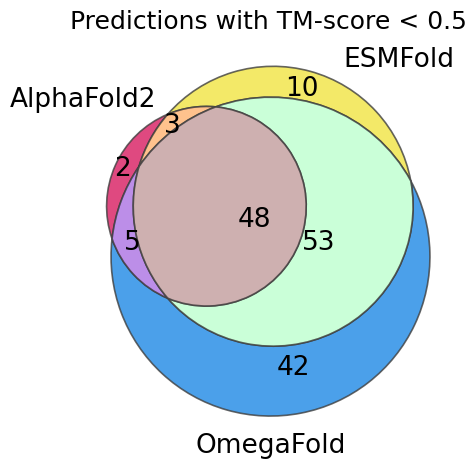

In [7]:
import matplotlib.pyplot as plt
from matplotlib_venn import venn3, venn3_circles

def make_venn3(sets, labels, title):
    v = venn3(sets, set_labels = labels, set_colors = ("#D81B60", "#F0E442", "#1E88E5"), alpha = 0.8)

    region_ids = ["100", "010", "110", "001", "101", "011", "111"]

    for rid in region_ids:
        patch = v.get_patch_by_id(rid)
        if patch:
            patch.set_edgecolor("#3f3f3f")
            patch.set_linewidth(1.2)

    # --- Your label formatting ---
    for subset in v.subset_labels or []:
        if subset:
            subset.set_color("black")
            subset.set_fontsize(19)

    for label in v.set_labels or []:
        if label:
            label.set_fontsize(19)
    
    plt.title(title, fontsize=18)
    plt.tight_layout()
    plt.show()

make_venn3([AF_bad_TM_score, EF_bad_TM_score, OF_bad_TM_score],
           ('AlphaFold2', 'ESMFold', 'OmegaFold'),
           "Predictions with TM-score < 0.5")

## RMSD

In [8]:
AF_bad_RMSD = set(chains[chains["AF_RMSD"] > 9]["chain_id"])
print(len(AF_bad_RMSD))

100


In [9]:
OF_bad_RMSD = set(chains[chains["OF_RMSD"] > 9]["chain_id"])
print(len(OF_bad_RMSD))

190


In [10]:
EF_bad_RMSD = set(chains[chains["EF_RMSD"] > 9]["chain_id"])
print(len(EF_bad_RMSD))

146


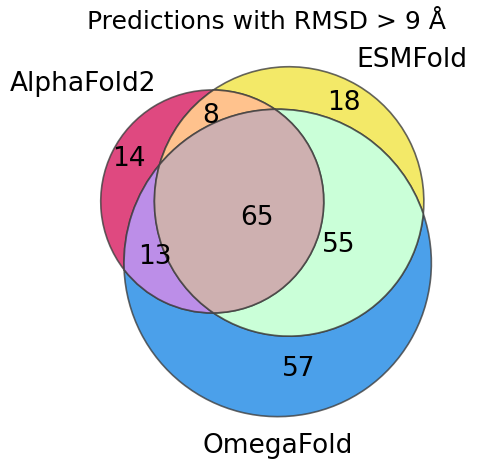

In [11]:
make_venn3([AF_bad_RMSD, EF_bad_RMSD, OF_bad_RMSD],
           ('AlphaFold2', 'ESMFold', 'OmegaFold'),
            "Predictions with RMSD > 9 Å")

## pLDDT

In [12]:
AF_bad_pLDDT = set(chains[chains["AF_average_pLDDT"] < 70]["chain_id"])
print(len(AF_bad_pLDDT))

32


In [13]:
OF_bad_pLDDT = set(chains[chains["OF_average_pLDDT"] < 70]["chain_id"])
print(len(OF_bad_pLDDT))

167


In [14]:
EF_bad_pLDDT = set(chains[chains["EF_average_pLDDT"] < 70]["chain_id"])
print(len(EF_bad_pLDDT))

137


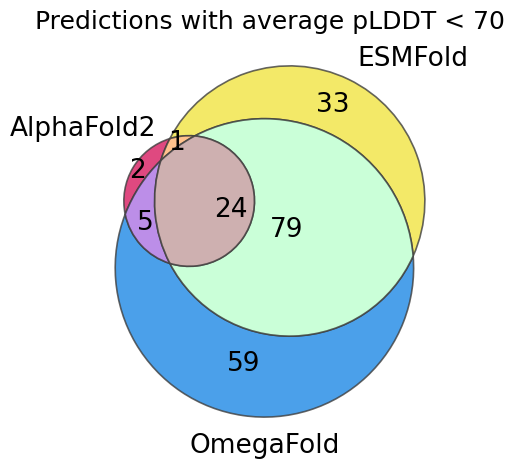

In [15]:
make_venn3([AF_bad_pLDDT, EF_bad_pLDDT, OF_bad_pLDDT],
           ('AlphaFold2', 'ESMFold', 'OmegaFold'),
           "Predictions with average pLDDT < 70")

## GDT-TS

GDT_TS values range from 0 (a meaningless prediction) to 100 (a perfect prediction). "Random predictions give around 20; getting the gross topology right gets one to ~50; accurate topology is usually around 70; and when all the little bits and pieces, including side-chain conformations, are correct, GDT_TS begins to climb above 90." (https://proteopedia.org/wiki/index.php/Calculating_GDT_TS)

In [16]:
AF_bad_GDT = set(chains[chains["AF_GDT_TS"] < 50]["chain_id"])
print(len(AF_bad_GDT))

90


In [17]:
OF_bad_GDT = set(chains[chains["OF_GDT_TS"] < 50]["chain_id"])
print(len(OF_bad_GDT))

191


In [18]:
EF_bad_GDT = set(chains[chains["EF_GDT_TS"] < 50]["chain_id"])
print(len(EF_bad_GDT))

142


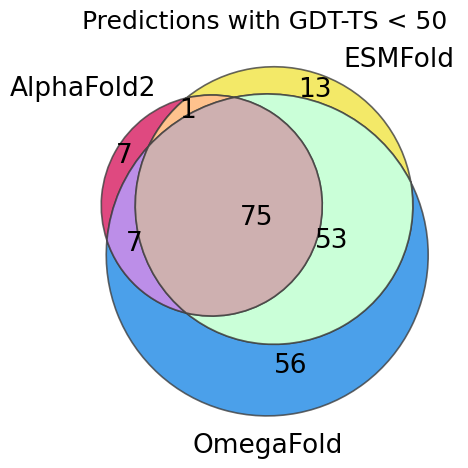

In [19]:
make_venn3([AF_bad_GDT, EF_bad_GDT, OF_bad_GDT],
           ('AlphaFold2', 'ESMFold', 'OmegaFold'),
           "Predictions with GDT-TS < 50")

## AlphaFold

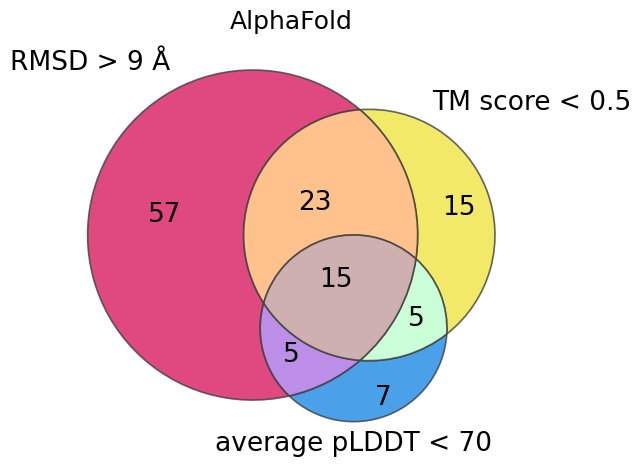

In [20]:
make_venn3([AF_bad_RMSD, AF_bad_TM_score, AF_bad_pLDDT],
           ('RMSD > 9 Å', 'TM score < 0.5', 'average pLDDT < 70'),
           "AlphaFold")

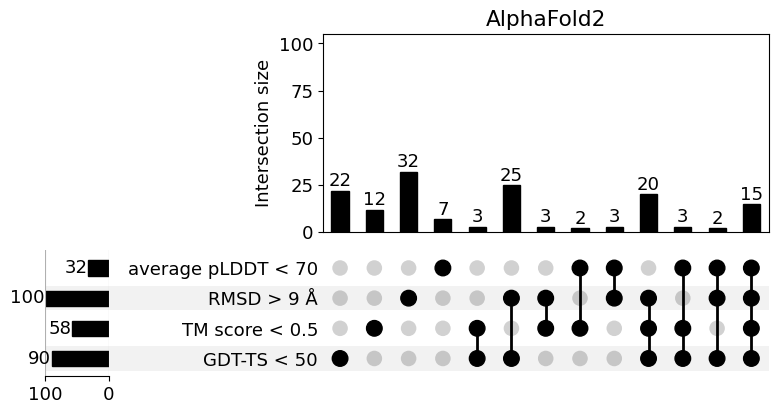

In [21]:
from upsetplot import plot, UpSet
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)


def make_upsetplot(sets: Dict[str, Set], names: List[str], plot_name: str) -> None:
    plt.rcParams['font.size'] = 13
    all_elements = sorted(list(sets[names[0]] | sets[names[1]] | sets[names[2]] | sets[names[3]]))

    df = pd.DataFrame({
        name: [item in sets[name] for item in all_elements] for name in names
    }, index=all_elements)

    upset_data = df.groupby(names).size()
    upset = UpSet(upset_data, show_counts = True, sort_categories_by = "input")
    upset.style_categories(names[0])
    plot_dict = upset.plot()
    main_ax = plot_dict['intersections']
    main_ax.spines['bottom'].set_visible(True)
    main_ax.spines['top'].set_visible(True)
    main_ax.spines['right'].set_visible(True)
    main_ax.spines['left'].set_visible(True)
    main_ax.tick_params(axis='x', which='both', bottom=True, labelbottom=True)
    plt.title(plot_name)
    plt.ylim(0, 105)
    plt.grid(False)
    plt.show()


make_upsetplot(
    {
        'RMSD > 9 Å': AF_bad_RMSD,
        'TM score < 0.5': AF_bad_TM_score,
        'GDT-TS < 50': AF_bad_GDT,
        'average pLDDT < 70': AF_bad_pLDDT
    },
    ['GDT-TS < 50', 'TM score < 0.5', 'RMSD > 9 Å', 'average pLDDT < 70'],
    "AlphaFold2"
)

## OmegaFold

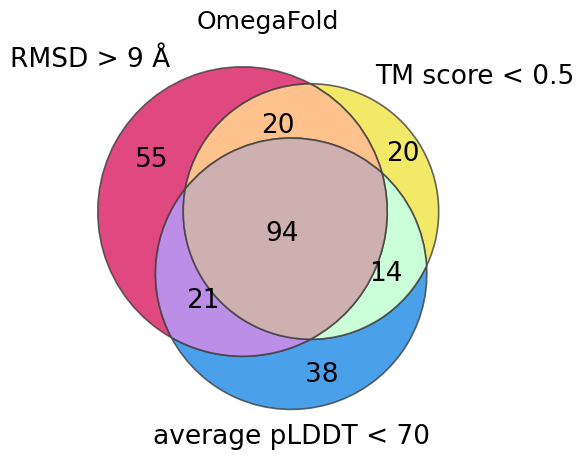

In [22]:
make_venn3([OF_bad_RMSD, OF_bad_TM_score, OF_bad_pLDDT],
           ('RMSD > 9 Å', 'TM score < 0.5', 'average pLDDT < 70'),
           "OmegaFold")

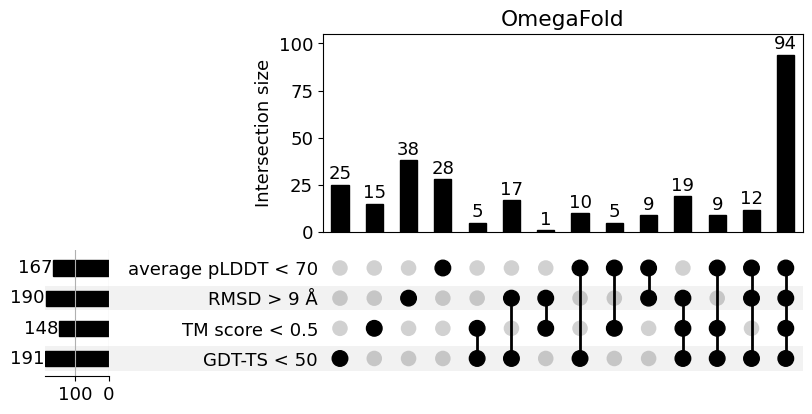

In [23]:
make_upsetplot(
    {
        'RMSD > 9 Å': OF_bad_RMSD,
        'TM score < 0.5': OF_bad_TM_score,
        'GDT-TS < 50': OF_bad_GDT,
        'average pLDDT < 70': OF_bad_pLDDT
    },
    ['GDT-TS < 50', 'TM score < 0.5', 'RMSD > 9 Å', 'average pLDDT < 70'],
    "OmegaFold"
)

## ESMFold

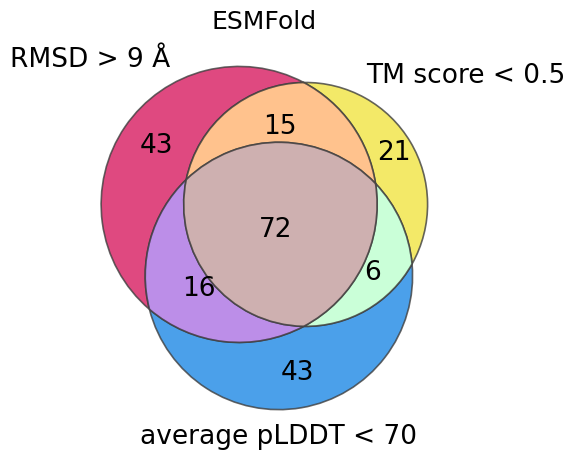

In [24]:
make_venn3([EF_bad_RMSD, EF_bad_TM_score, EF_bad_pLDDT],
           ('RMSD > 9 Å', 'TM score < 0.5', 'average pLDDT < 70'),
           "ESMFold")

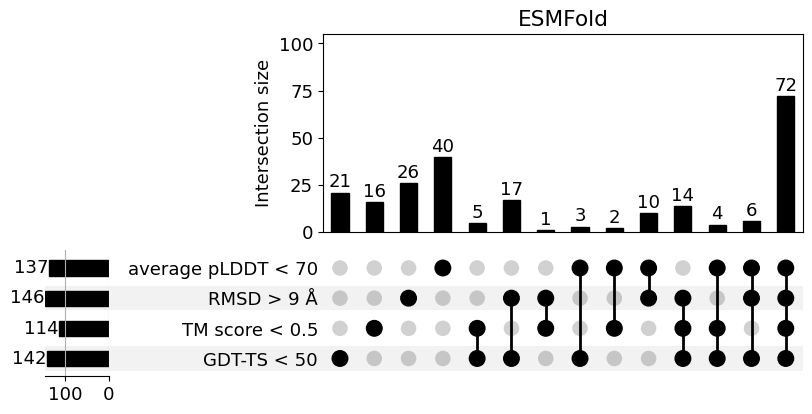

In [25]:
make_upsetplot(
    {
        'RMSD > 9 Å': EF_bad_RMSD,
        'TM score < 0.5': EF_bad_TM_score,
        'GDT-TS < 50': EF_bad_GDT,
        'average pLDDT < 70': EF_bad_pLDDT
    },
    ['GDT-TS < 50', 'TM score < 0.5', 'RMSD > 9 Å', 'average pLDDT < 70'],
    "ESMFold"
)

## Worst AlphaFold predictions

In [26]:
chains.nlargest(3, "AF_RMSD")

,pdb_id,label,chain_id,AF_average_pLDDT,OF_average_pLDDT,EF_average_pLDDT,AF_TM_score,OF_TM_score,EF_TM_score,AF_RMSD,OF_RMSD,EF_RMSD,AF_GDT_TS,OF_GDT_TS,EF_GDT_TS
577,8TVL,monomer,8TVL:A,82.175056,78.903371,81.567416,0.136328,0.172634,0.214826,111.591237,56.989083,78.661937,7.914201,8.136095,8.579882
1325,8P4Y,synthetic,8P4Y:A,90.574975,83.017264,73.572139,0.202441,0.260387,0.379051,80.594256,43.101753,30.652166,18.489583,19.661458,36.067708
783,8J8I,monomer,8J8I:A,62.653857,50.351786,50.021429,0.180013,0.230217,0.182883,34.768679,26.939025,43.058583,12.954545,17.500000,12.954545


In [49]:
import py3Dmol
import numpy as np
from Bio.PDB import PDBParser, PDBIO

def align_and_save(pdb_path, pdb_path_aligned, rotation_path, translation_path):
    structure = PDBParser().get_structure("prediction", pdb_path)[0]
    structure.transform(np.load(rotation_path), np.load(translation_path))
    io = PDBIO()
    io.set_structure(structure)
    io.save(pdb_path_aligned)


def display_two_structures(pdb_path_reference, pdb_path_prediction, colour):
    view = py3Dmol.view(width=1000, height=600)
    view.addModel(open(pdb_path_reference, 'r').read(), 'pdb')
    view.addModel(open(pdb_path_prediction, 'r').read(), 'pdb')
    view.setStyle({'cartoon': {'color': "#0072B2"}})
    # (the predicted structure is red, https://william-dawson.github.io/using-py3dmol.html)
    view.setStyle({'model': -1}, {'cartoon': {'color': colour}})
    view.zoomTo()
    view.show()


def align_and_display(protein_directory, pdb_id, chain_id, tool, colour):
    align_and_save(
        f"{protein_directory}/{pdb_id}/{tool}/{chain_id}.pdb",
        f"{protein_directory}/{pdb_id}/{tool}/{chain_id}_aligned.pdb",
        f"{protein_directory}/{pdb_id}/{tool}/rotation.npy",
        f"{protein_directory}/{pdb_id}/{tool}/translation.npy"
    )
    display_two_structures(
        f"{protein_directory}/{pdb_id}/{pdb_id}_original.pdb",
        f"{protein_directory}/{pdb_id}/{tool}/{chain_id}_aligned.pdb",
        colour
    )

In [28]:
align_and_display("data/proteins", "8TVL", "8TVL:A", "alphafold", "#F0D142")

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

In [50]:
align_and_display("data/proteins", "8P4Y", "8P4Y:A", "alphafold", "#FFF243")

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

In [30]:
align_and_display("data/proteins", "8J8I", "8J8I:A", "alphafold", "#F0D142")

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

## Worst ESMFold predictions

In [31]:
chains.nlargest(3, "EF_RMSD")

,pdb_id,label,chain_id,AF_average_pLDDT,OF_average_pLDDT,EF_average_pLDDT,AF_TM_score,OF_TM_score,EF_TM_score,AF_RMSD,OF_RMSD,EF_RMSD,AF_GDT_TS,OF_GDT_TS,EF_GDT_TS
577,8TVL,monomer,8TVL:A,82.175056,78.903371,81.567416,0.136328,0.172634,0.214826,111.591237,56.989083,78.661937,7.914201,8.136095,8.579882
783,8J8I,monomer,8J8I:A,62.653857,50.351786,50.021429,0.180013,0.230217,0.182883,34.768679,26.939025,43.058583,12.954545,17.500000,12.954545
617,8EW5,monomer,8EW5:A,64.717632,56.464342,40.901316,0.447963,0.260032,0.260019,20.465529,29.940409,31.587262,39.864865,25.000000,23.648649


In [32]:
align_and_display("data/proteins", "8TVL", "8TVL:A", "esmfold", "#F1A600")

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

In [33]:
align_and_display("data/proteins", "8J8I", "8J8I:A", "esmfold", "#F1A600")

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

In [34]:
align_and_display("data/proteins", "8EW5", "8EW5:A", "esmfold", "#F1A600")

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

## Worst OmegaFold predictions

In [35]:
chains.nlargest(3, "OF_RMSD")

,pdb_id,label,chain_id,AF_average_pLDDT,OF_average_pLDDT,EF_average_pLDDT,AF_TM_score,OF_TM_score,EF_TM_score,AF_RMSD,OF_RMSD,EF_RMSD,AF_GDT_TS,OF_GDT_TS,EF_GDT_TS
577,8TVL,monomer,8TVL:A,82.175056,78.903371,81.567416,0.136328,0.172634,0.214826,111.591237,56.989083,78.661937,7.914201,8.136095,8.579882
1325,8P4Y,synthetic,8P4Y:A,90.574975,83.017264,73.572139,0.202441,0.260387,0.379051,80.594256,43.101753,30.652166,18.489583,19.661458,36.067708
617,8EW5,monomer,8EW5:A,64.717632,56.464342,40.901316,0.447963,0.260032,0.260019,20.465529,29.940409,31.587262,39.864865,25.000000,23.648649


In [36]:
align_and_display("data/proteins", "8TVL", "8TVL:A", "omegafold", "#DA5202")

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

In [37]:
align_and_display("data/proteins", "8P4Y", "8P4Y:A", "omegafold", "#DA5202")

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

In [38]:
align_and_display("data/proteins", "8EW5", "8EW5:A", "omegafold", "#DA5202")

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

In [39]:
difference_df = pd.DataFrame({
    "chain_id": chains["chain_id"],
    "AF_vs_EF_TMscore": chains["AF_TM_score"] - chains["EF_TM_score"],
    "AF_vs_OF_TMscore": chains["AF_TM_score"] - chains["OF_TM_score"],
    "EF_vs_OF_TMscore": chains["EF_TM_score"] - chains["OF_TM_score"],
    "AF_vs_EF_RMSD": chains["AF_RMSD"] - chains["EF_RMSD"],
    "AF_vs_OF_RMSD": chains["AF_RMSD"] - chains["OF_RMSD"],
    "EF_vs_OF_RMSD": chains["EF_RMSD"] - chains["OF_RMSD"]
}).dropna()
difference_df

,chain_id,AF_vs_EF_TMscore,AF_vs_OF_TMscore,EF_vs_OF_TMscore,AF_vs_EF_RMSD,AF_vs_OF_RMSD,EF_vs_OF_RMSD
0,8P0E:A,-0.016138,-0.000772,0.015366,1.054055,0.019404,-1.034651
1,8PX8:A,0.005478,-0.000728,-0.006206,-0.430526,0.022651,0.453177
2,8B2E:A,0.000956,0.012532,0.011576,-0.024594,-0.267946,-0.243353
3,8HOE:A,0.012352,0.124506,0.112154,-0.269789,-1.789458,-1.519669
4,8TCE:A,0.017734,0.017758,0.000024,-0.812041,-0.765395,0.046646
...,...,...,...,...,...,...,...
1332,8G9J:A,-0.346867,-0.346639,0.000228,5.875979,5.871798,-0.004181
1333,8OYV:A,0.000780,0.001988,0.001208,-0.008547,-0.036231,-0.027684
1334,8TNO:A,0.008249,-0.000007,-0.008255,0.096300,0.139590,0.043289
1335,8FJE:A,-0.002152,0.004688,0.006840,0.040982,-0.064547,-0.105529


In [40]:
AF_better_EF_TMscore = set(difference_df[difference_df["AF_vs_EF_TMscore"] > 0]["chain_id"])
print(len(AF_better_EF_TMscore))

924


In [41]:
AF_better_EF_RMSD = set(difference_df[difference_df["AF_vs_EF_RMSD"] < 0]["chain_id"])
print(len(AF_better_EF_RMSD))

877


In [42]:
AF_better_OF_TMscore = set(difference_df[difference_df["AF_vs_OF_TMscore"] > 0]["chain_id"])
print(len(AF_better_OF_TMscore))

999


In [43]:
AF_better_OF_RMSD = set(difference_df[difference_df["AF_vs_OF_RMSD"] < 0]["chain_id"])
print(len(AF_better_OF_RMSD))

938


In [44]:
EF_better_OF_TMscore = set(difference_df[difference_df["EF_vs_OF_TMscore"] > 0]["chain_id"])
print(len(EF_better_OF_TMscore))

811


In [45]:
EF_better_OF_RMSD = set(difference_df[difference_df["EF_vs_OF_RMSD"] < 0]["chain_id"])
print(len(EF_better_OF_RMSD))

786


In [46]:
align_and_display("data/proteins", "8PTF", "8PTF:A", "alphafold", "#FFF243")

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

In [47]:
align_and_display("data/proteins", "8PTF", "8PTF:A", "esmfold", "#FFB000")

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

In [48]:
align_and_display("data/proteins", "8PTF", "8PTF:A", "omegafold", "#F56C00")

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol